In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import fastcluster
import sklearn as sk

In [2]:
expression_data = pd.read_csv("Expression_(Short-read)_Public_26Q1_subsetted.csv", index_col=0)

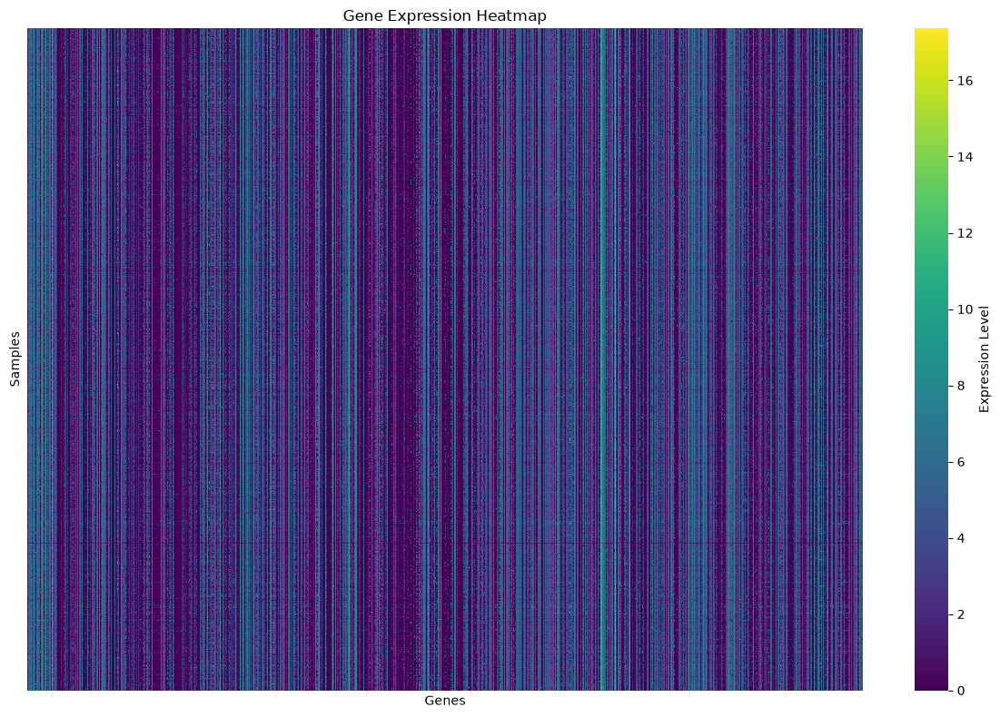

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(expression_data, cmap='viridis', cbar_kws={'label': 'Expression Level'}, xticklabels=False, yticklabels=False)
plt.title('Gene Expression Heatmap')
plt.xlabel('Genes')
plt.ylabel('Samples')
plt.tight_layout()
plt.show()

## Clustered heatmap

1. **Subset to the most variable genes** — most genes are flat across cell lines and just add noise to the clustering; the top variable genes carry the signal.
2. **Z-score each gene** across samples, so clustering reflects relative pattern (up/down) rather than absolute expression magnitude (some genes are just highly expressed everywhere). This z-scored version is used *only* to compute the clustering — the heatmap itself displays the original raw expression values via `clustermap`'s `row_linkage`/`col_linkage` parameters, which accept a precomputed clustering and leave the displayed data untouched.
3. **Hierarchically cluster both rows (samples) and columns (genes)** and reorder the heatmap accordingly, using `seaborn.clustermap`.


In [83]:
from scipy.cluster.hierarchy import leaves_list
# Keep only the most variable genes; z-score is used only to compute the clustering,
# the raw values in expr_top are kept for display.
N_TOP_GENES = 5000

gene_variance = expression_data.var(axis=0)
top_genes = gene_variance.sort_values(ascending=False).head(N_TOP_GENES).index

expr_top = expression_data[top_genes]
expr_z = (expr_top - expr_top.mean(axis=0)) / expr_top.std(axis=0)

row_linkage_top = fastcluster.linkage_vector(expr_z.values, method='ward', metric='euclidean')
col_linkage_top = fastcluster.linkage_vector(expr_z.values.T, method='ward', metric='euclidean')

expr_z_reordered = expr_z.iloc[leaves_list(row_linkage_top), leaves_list(col_linkage_top)]

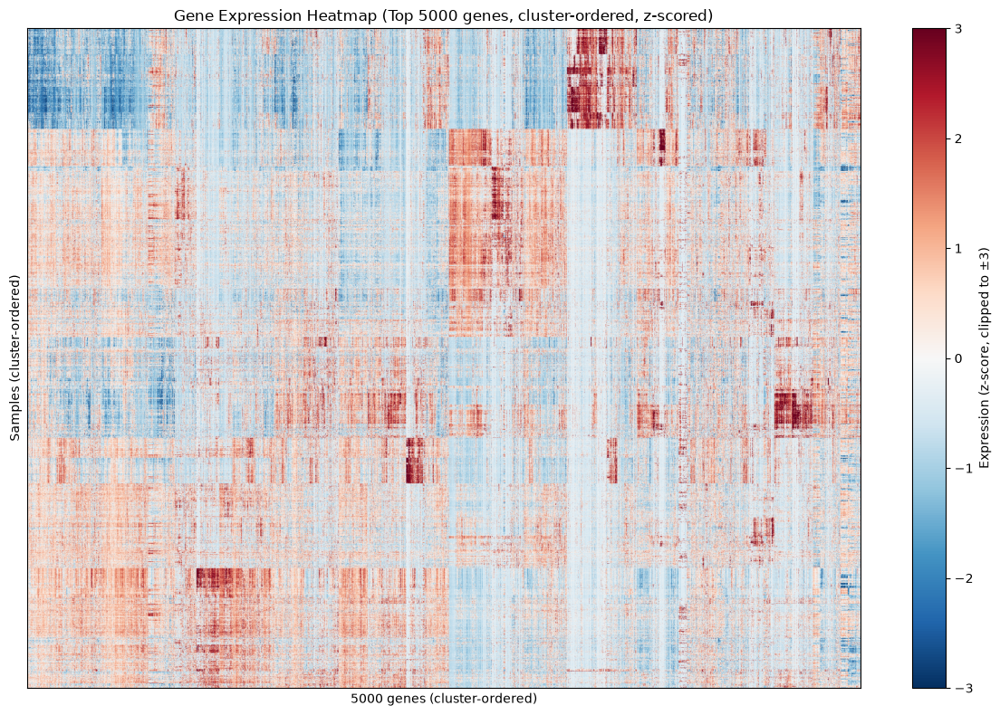

In [84]:

fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(expr_z_reordered.values, aspect='auto', cmap='RdBu_r', vmin=-3, vmax=3)
fig.colorbar(im, ax=ax, label='Expression (z-score, clipped to ±3)')
ax.set_title(f'Gene Expression Heatmap (Top {N_TOP_GENES} genes, cluster-ordered, z-scored)')
ax.set_xlabel(f'{expr_z_reordered.shape[1]} genes (cluster-ordered)')
ax.set_ylabel('Samples (cluster-ordered)')
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

## Clustered heatmap for all genes

In [78]:
from scipy.cluster.hierarchy import leaves_list

# Drop zero-variance genes (can't z-score them), then z-score the rest. Both
# clustering and the reordered matrix used for display are based on this
# z-scored version - no subsetting, no reverting to raw values.
gene_variance_all = expression_data.var(axis=0)
expr_all = expression_data[gene_variance_all[gene_variance_all > 0].index]
expr_all_z = (expr_all - expr_all.mean(axis=0)) / expr_all.std(axis=0)

row_linkage_all = fastcluster.linkage_vector(expr_all_z.values, method='ward', metric='euclidean')
col_linkage_all = fastcluster.linkage_vector(expr_all_z.values.T, method='ward', metric='euclidean')

row_order_all = leaves_list(row_linkage_all)
col_order_all = leaves_list(col_linkage_all)

expr_all_reordered = expr_all_z.iloc[row_order_all, col_order_all]

expr_all_reordered.shape

(1719, 19210)

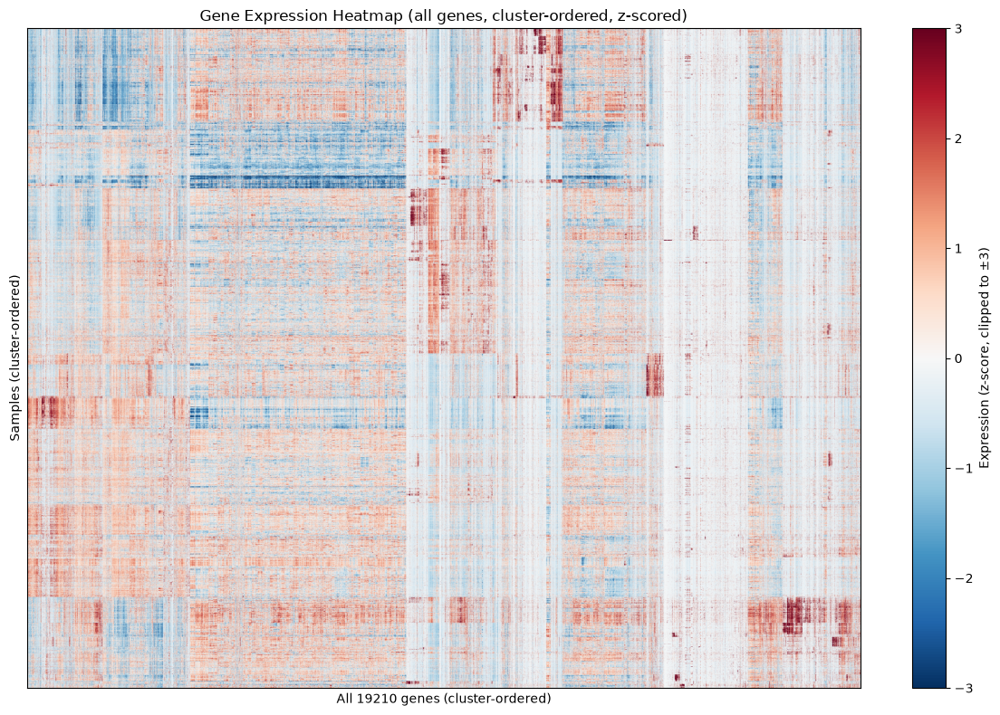

In [79]:
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(expr_all_reordered.values, aspect='auto', cmap='RdBu_r', vmin=-3, vmax=3)
fig.colorbar(im, ax=ax, label='Expression (z-score, clipped to ±3)')
ax.set_title('Gene Expression Heatmap (all genes, cluster-ordered, z-scored)')
ax.set_xlabel(f'All {expr_all_reordered.shape[1]} genes (cluster-ordered)')
ax.set_ylabel('Samples (cluster-ordered)')
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

In [26]:
mutation_data = pd.read_csv("Damaging_Mutations_(Public_26Q1)_subsetted.csv", index_col=0)

In [34]:
value_counts = mutation_data.stack().value_counts()
print(value_counts)

0.0    38266454
1.0      108730
2.0       10656
Name: count, dtype: int64


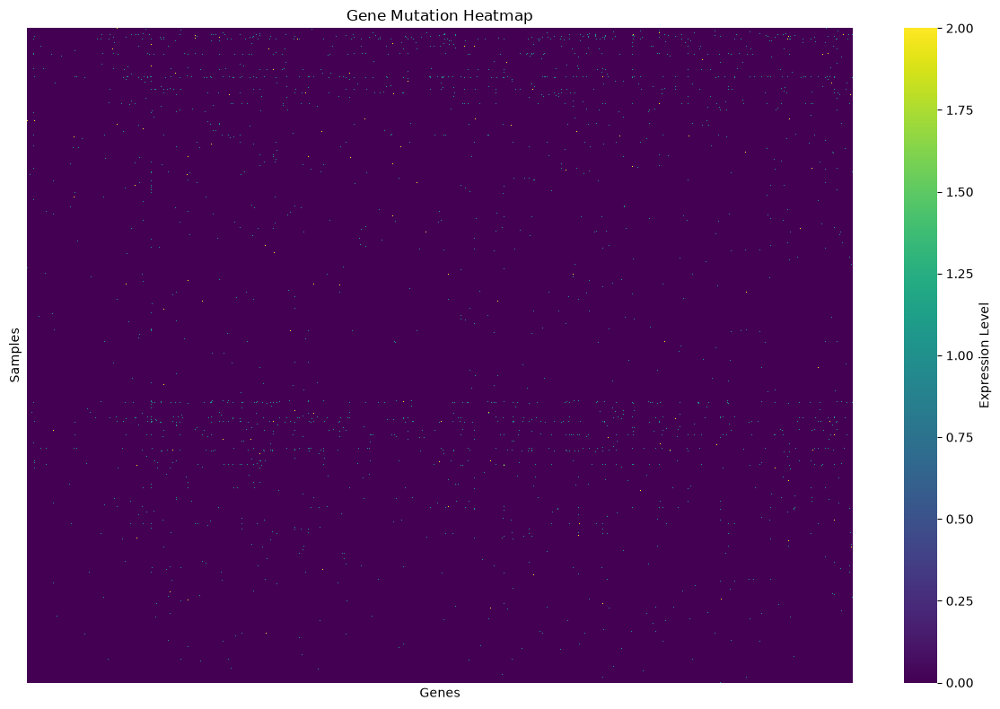

In [27]:
plt.figure(figsize=(12, 8))
sns.heatmap(mutation_data, cmap='viridis', cbar_kws={'label': 'Expression Level'}, xticklabels=False, yticklabels=False)
plt.title('Gene Mutation Heatmap')
plt.xlabel('Genes')
plt.ylabel('Samples')
plt.tight_layout()
plt.show()

## Clustered mutation heatmap

Same approach as the full gene-expression heatmap above: z-score for clustering only (mutation counts are 0/1/2, so most genes are almost entirely 0 — z-scoring keeps the rare-mutation columns from being swamped), cluster with `fastcluster`, then display the original 0/1/2 values reordered, drawn with `imshow` rather than `clustermap`/`sns.heatmap` for speed on a ~38M-cell array.

1048 genes are mutated in none of these cell lines — dropped first since they have zero variance. Clustering on the full remaining ~18,450 genes (no subsetting) takes roughly 8-9 minutes, similar to the full expression case — sparsity doesn't reduce the cost of this clustering algorithm, since it still operates on the dense matrix regardless of how many values are 0.

In [36]:
# Drop genes with zero variance (never mutated in this cell line panel); z-score the
# rest for clustering only, keep the raw 0/1/2 values for display.
mutation_variance = mutation_data.var(axis=0)
mutation_nonzero = mutation_data[mutation_variance[mutation_variance > 0].index]
mutation_z = (mutation_nonzero - mutation_nonzero.mean(axis=0)) / mutation_nonzero.std(axis=0)

row_linkage_mut = fastcluster.linkage_vector(mutation_z.values, method='ward', metric='euclidean')
col_linkage_mut = fastcluster.linkage_vector(mutation_z.values.T, method='ward', metric='euclidean')

row_order_mut = leaves_list(row_linkage_mut)
col_order_mut = leaves_list(col_linkage_mut)

# Reorder the RAW (0/1/2) data for display
mutation_reordered = mutation_nonzero.iloc[row_order_mut, col_order_mut]

mutation_reordered.shape

(1968, 18457)

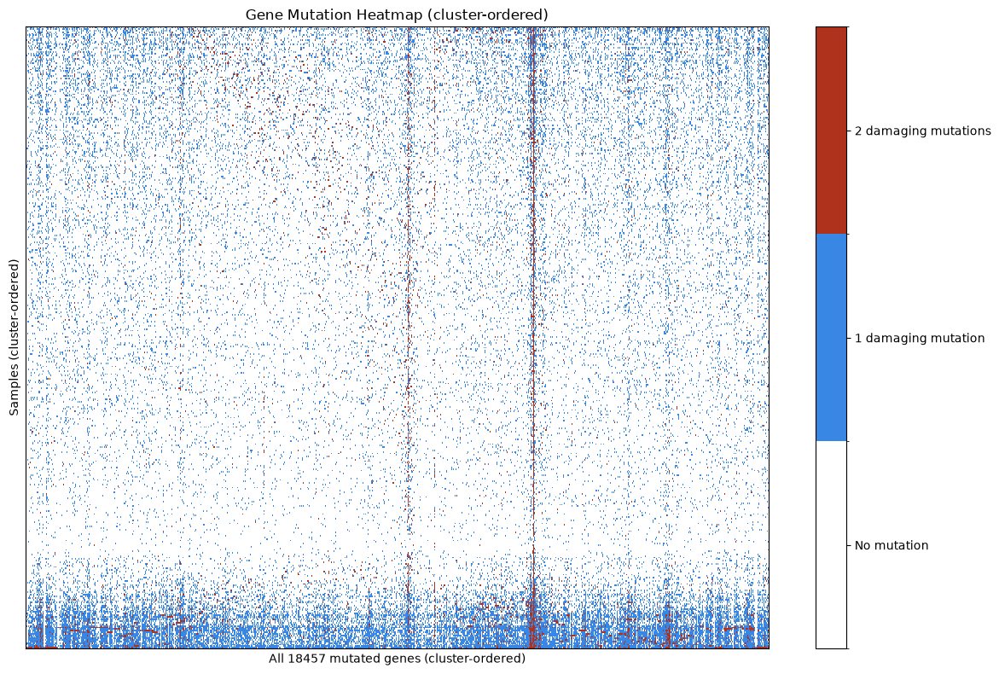

In [105]:
from matplotlib.colors import ListedColormap, BoundaryNorm

def block_reduce_max(arr, out_rows, out_cols):
    """Downsample by taking the max value in each block, so a rare mutation
    can never be lost or diluted the way imshow's default (averaging)
    downsampling would when squeezing ~36M cells into a much smaller image."""
    n_rows, n_cols = arr.shape
    out_rows, out_cols = min(out_rows, n_rows), min(out_cols, n_cols)
    row_idx = np.linspace(0, n_rows, out_rows, endpoint=False).astype(int)
    col_idx = np.linspace(0, n_cols, out_cols, endpoint=False).astype(int)
    reduced = np.maximum.reduceat(arr, row_idx, axis=0)
    reduced = np.maximum.reduceat(reduced, col_idx, axis=1)
    return reduced

# Deliberately coarser than the screen resolution, so imshow only ever
# upsamples (crisp, visible blocks) and never re-downsamples what we just
# carefully preserved.
mutation_display = block_reduce_max(mutation_reordered.values, 400, 1000)

# One-hue sequential ramp with monotone lightness: 0 recedes toward the
# background, 1 and 2 get progressively darker/more saturated so mutations
# stand out instead of blending into a continuous colormap.
mutation_cmap = ListedColormap(["#ffffff", '#3987e5', "#af321c"])
mutation_norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5], mutation_cmap.N)

fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(mutation_display, aspect='auto', cmap=mutation_cmap, norm=mutation_norm, interpolation='nearest')
cbar = fig.colorbar(im, ax=ax, ticks=[0, 1, 2])
cbar.ax.set_yticklabels(['No mutation', '1 damaging mutation', '2 damaging mutations'])
ax.set_title('Gene Mutation Heatmap (cluster-ordered)')
ax.set_xlabel(f'All {mutation_reordered.shape[1]} mutated genes (cluster-ordered)')
ax.set_ylabel('Samples (cluster-ordered)')
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

## Heatmaps grouped by subtype

`subtype_data` is multi-label — each sample is flagged (1) for several columns at once: tissue/lineage, disease subtype, *and* molecular-alteration status (gene loss-of-function, hotspot mutations) all mixed into the same 1018 columns. To group by "a subtype," each sample needs a single representative label, so:

1. Columns that look like molecular-alteration flags by name (`_LoF` suffix, `p.<change>` mutation notation, plus a few bare gene/status flags found by inspecting the data: `MSI`, `KRAS`, `NRAS`, `HRAS`, `PIK3CA`) are excluded from consideration.
2. Each sample gets the **largest (broadest) remaining group it belongs to** as its representative subtype — this approximates tissue lineage.

This is a heuristic, not ground truth from the data's schema — if a mutation-status flag still shows up as a "subtype" in the counts below, extend `EXCLUDE_SUBTYPES`.

The gene (column) order below reuses whatever ordering was already computed further up (`expr_all_reordered` / `mutation_reordered`) — only the *row* order changes, from hierarchical clustering to subtype grouping. Group boundaries are labeled directly on the y-axis rather than with a 30+-entry color legend.

In [ ]:
subtype_data = pd.read_csv("Subtype_Matrix_Public_26Q1_subsetted.csv", index_col=0)

In [74]:
# Assign each sample one representative ("broadest applicable") subtype label.
EXCLUDE_SUBTYPES = ['MSI', 'KRAS', 'NRAS', 'HRAS', 'PIK3CA']
exclude_cols = subtype_data.columns[subtype_data.columns.str.contains(r'_LoF|p\.', regex=True)].tolist() + EXCLUDE_SUBTYPES
lineage_cols = subtype_data.columns.difference(exclude_cols)
subtype_group_sizes = subtype_data[lineage_cols].sum(axis=0)

def pick_primary_subtype(row):
    positive = row[row == 1].index.intersection(lineage_cols)
    return subtype_group_sizes[positive].idxmax() if len(positive) else 'Unknown'

sample_subtype = subtype_data.apply(pick_primary_subtype, axis=1)

def subtype_row_order(subtype_series):
    """Sort samples by subtype (alphabetical, 'Unknown' last) and return the
    sample order plus group boundaries/labels for tick placement."""
    subtype_series = subtype_series.fillna('Unknown')
    categories = sorted(subtype_series.unique(), key=lambda s: (s == 'Unknown', s))
    codes = pd.Categorical(subtype_series, categories=categories, ordered=True).codes
    order = subtype_series.index[np.argsort(codes, kind='stable')]
    sorted_labels = subtype_series.loc[order].reset_index(drop=True)
    change_points = sorted_labels.ne(sorted_labels.shift()).to_numpy().nonzero()[0].tolist() + [len(sorted_labels)]
    tick_positions = [(change_points[i] + change_points[i + 1] - 1) / 2 for i in range(len(change_points) - 1)]
    tick_labels = [sorted_labels[change_points[i]] for i in range(len(change_points) - 1)]
    return order, change_points, tick_positions, tick_labels

sample_subtype.value_counts()

LUNG             261
LYMPH            239
SKIN             150
BRAIN            127
STOMACH          104
BONE             101
BOWEL             99
SOFT_TISSUE       99
BREAST            96
HEAD_NECK         94
MYELOID           88
OVARY             76
KIDNEY            74
PANCREAS          68
PNS               62
Unknown           53
ZFIB              45
BILIARY_TRACT     45
UTERUS            44
BLADDER           39
PLEURA            36
LIVER             29
THYROID           26
CERVIX            26
EYE               24
PROSTATE          15
NSGCT             12
AMPCA              5
VULVA              5
MUSCLE             5
ACC                2
EGCT               2
HAIR               2
EMBRYONAL          1
Name: count, dtype: int64

### Branching within each subtype

`sample_subtype` above collapses each sample to one *broadest* label, but the underlying `subtype_data` columns actually form a real hierarchy (e.g. a lung sample can be flagged for `LUNG`, `NSCLC`, and `LUAD` all at once — lineage, then subtype, then sub-subtype). We can recover that structure directly from the data rather than guessing at it: for the members of a given broad subtype, one column is a **child** of another if every sample carrying the child flag also carries the candidate-parent flag (a strict subset relationship) — the *immediate* parent is the smallest such superset. This is computed via boolean containment, not assumed from column names.

In [63]:
MIN_SAMPLES_PER_SUBTYPE = 1  # only trees for broad subtypes at least this large

# Same idea as EXCLUDE_SUBTYPES in the cell above: some subtype-matrix columns
# are molecular-alteration flags rather than tissue subtypes, and can show up
# either as a primary subtype itself (e.g. "KRAS (151)") or as a confusing
# branch nested under an unrelated tissue. Excluded from both roles here.
EXCLUDE_FROM_TREES = ['MSI', 'KRAS', 'NRAS', 'HRAS', 'PIK3CA']


def branch_tree(primary, exclude=EXCLUDE_FROM_TREES):
    """Among samples whose broadest subtype is `primary`, find every other
    lineage column that also appears, and its immediate parent (the smallest
    other branch column it's a strict subset of - or `primary` itself if none)."""
    members = sample_subtype[sample_subtype == primary].index
    branch = subtype_data.loc[members, lineage_cols].drop(columns=[primary] + list(exclude), errors='ignore')
    branch = branch.loc[:, branch.sum(axis=0) > 0]

    cols = branch.columns.to_list()
    arrs = {c: branch[c].to_numpy(dtype=bool) for c in cols}
    sizes = {c: int(arrs[c].sum()) for c in cols}

    parent = {}
    for ci in cols:
        candidates = [
            cj for cj in cols
            if cj != ci and sizes[cj] > sizes[ci] and np.logical_and(arrs[ci], arrs[cj]).sum() == sizes[ci]
        ]
        if candidates:
            parent[ci] = min(candidates, key=lambda c: sizes[c])  # smallest (most specific) superset
    return sizes, parent


def print_subtype_tree(primary, member_count, sizes, parent):
    print(f'{primary} ({member_count})')

    def _print_children(node, indent):
        children = sorted((c for c, p in parent.items() if p == node), key=lambda c: -sizes[c])
        for c in children:
            print('  ' * indent + f'- {c} ({sizes[c]})')
            _print_children(c, indent + 1)

    roots = [c for c in sizes if c not in parent]
    if not roots:
        print('  (no finer subtypes found)')
    for r in sorted(roots, key=lambda c: -sizes[c]):
        print(f'  - {r} ({sizes[r]})')
        _print_children(r, 2)


large_subtypes = sample_subtype.value_counts()
large_subtypes = large_subtypes[
    (large_subtypes >= MIN_SAMPLES_PER_SUBTYPE)
    & (~large_subtypes.index.isin(['Unknown'] + EXCLUDE_FROM_TREES))
]

for primary, member_count in large_subtypes.items():
    sizes, parent = branch_tree(primary)
    print_subtype_tree(primary, member_count, sizes, parent)
    print()

LUNG (261)
  - NSCLC (165)
    - LUAD (91)
    - LUSC (32)
    - LCLC (18)
      - GCLC (4)
    - EGFR (9)
      - EGFRexon19del (7)
    - LUAS (6)
    - NUTCL (2)
    - LUMEC (1)
    - NSCLCPD (1)
    - SGTTL (1)
  - LNET (86)
    - SCLC (82)
    - LUCA (4)
  - ZLUNG (6)
    - ZIMMEPCL (4)
    - ZIMMLUNG (1)
    - ZIMMMPLC (1)
  - KMT2AFusions (4)
  - SMARCA4-UT (4)

LYMPH (239)
  - LNM (234)
    - NHL (163)
      - MBN (135)
        - DLBCLNOS (42)
          - ABC (5)
          - GCB (5)
        - PCM (34)
        - BL (23)
        - MCL (8)
        - PEL (6)
        - CLLSLL (5)
        - HCL (5)
        - FL (2)
        - MZL (2)
        - SMZL (2)
        - BPLL (1)
        - HGBCLMYCBCL2 (1)
        - PMBL (1)
      - MTNN (20)
        - ALCL (10)
          - ALCLALKP (7)
          - ALCLALKN (3)
        - SS (2)
        - FTCL (1)
        - HSTCL (1)
        - MYCF (1)
        - TLGL (1)
        - TPLL (1)
    - BALL (33)
      - BALL:BCR-ABL1 (5)
      - BCR-ABL1 (5)
      - BA

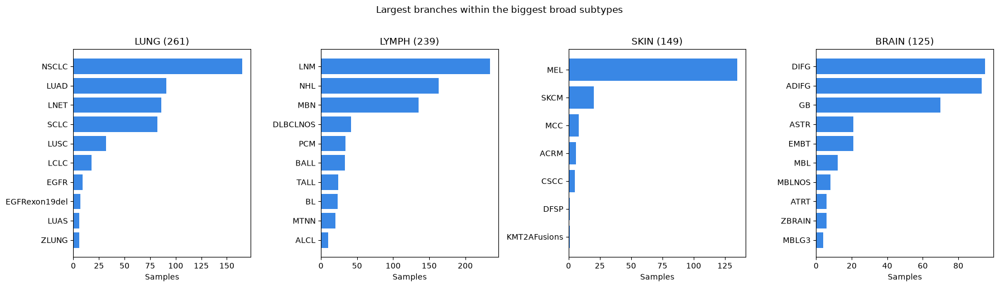

In [70]:
# Visual companion to the trees above: branch sizes for the largest broad subtypes.
TOP_N_TREES_TO_PLOT = 4
BRANCHES_PER_PLOT = 10

top_subtypes = large_subtypes.head(TOP_N_TREES_TO_PLOT)

fig, axes = plt.subplots(1, len(top_subtypes), figsize=(4.5 * len(top_subtypes), 5))
axes = np.atleast_1d(axes)
for ax, (primary, member_count) in zip(axes, top_subtypes.items()):
    sizes, _ = branch_tree(primary)
    top_branches = pd.Series(sizes).sort_values(ascending=False).head(BRANCHES_PER_PLOT)
    ax.barh(top_branches.index[::-1], top_branches.values[::-1], color='#3987e5')
    ax.set_title(f'{primary} ({member_count})')
    ax.set_xlabel('Samples')

fig.suptitle('Largest branches within the biggest broad subtypes', y=1.02)
plt.tight_layout()
plt.show()

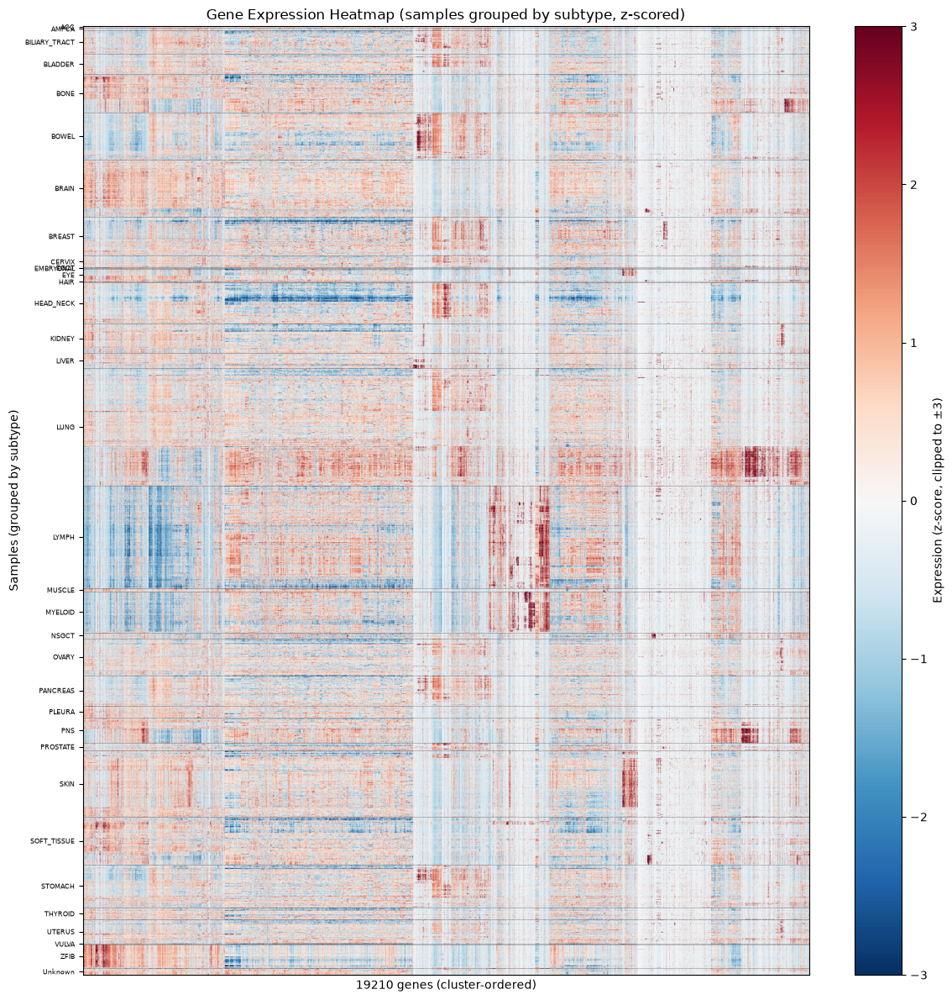

In [112]:
# Re-row expr_all_reordered (already gene-clustered by column, z-scored) using
# subtype order instead of the earlier row-clustering order.
expr_subtype = sample_subtype.reindex(expr_all_reordered.index)
expr_sample_order, expr_change_points, expr_tick_pos, expr_tick_labels = subtype_row_order(expr_subtype)
expr_grouped = expr_all_reordered.loc[expr_sample_order]

fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(expr_grouped.values, aspect='auto', cmap='RdBu_r', vmin=-3, vmax=3)
fig.colorbar(im, ax=ax, label='Expression (z-score, clipped to ±3)')
for cp in expr_change_points[1:-1]:
    ax.axhline(cp - 0.5, color='black', linewidth=0.5, alpha=0.3)
ax.set_yticks(expr_tick_pos)
ax.set_yticklabels(expr_tick_labels, fontsize=6)
ax.set_xticks([])
ax.set_xlabel(f'{expr_grouped.shape[1]} genes (cluster-ordered)')
ax.set_ylabel('Samples (grouped by subtype)')
ax.set_title('Gene Expression Heatmap (samples grouped by subtype, z-scored)')
plt.tight_layout()
plt.show()

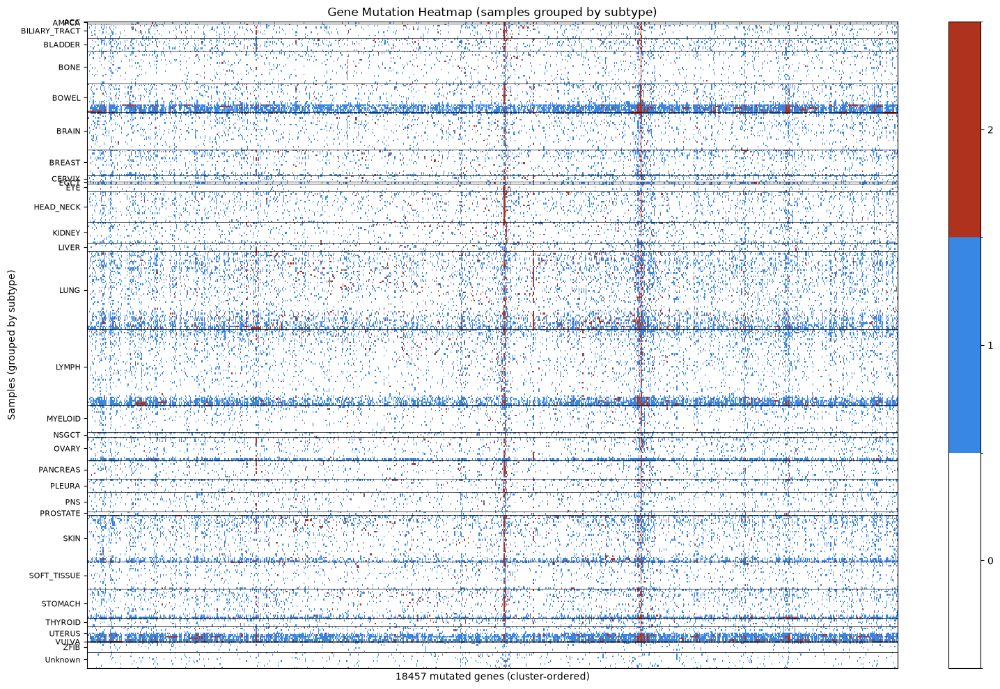

In [111]:
# Same idea for the mutation heatmap. Reuses block_reduce_max/mutation_cmap/
# mutation_norm defined earlier. Group boundaries are computed in the original
# (pre-downsample) row space, then remapped into the reduced-row space so the
# tick labels/separator lines still line up with the coarser image.
mutation_subtype = sample_subtype.reindex(mutation_reordered.index)
mut_sample_order, mut_change_points, _, mut_tick_labels = subtype_row_order(mutation_subtype)
mutation_grouped = mutation_reordered.loc[mut_sample_order]

OUT_ROWS, OUT_COLS = 400, 1000
mutation_grouped_display = block_reduce_max(mutation_grouped.values, OUT_ROWS, OUT_COLS)

n_rows = mutation_grouped.shape[0]
out_rows = min(OUT_ROWS, n_rows)
row_bin_idx = np.linspace(0, n_rows, out_rows, endpoint=False).astype(int)
mut_reduced_boundaries = [int(np.searchsorted(row_bin_idx, cp, side='right') - 1) for cp in mut_change_points]
mut_tick_pos = [(mut_reduced_boundaries[i] + mut_reduced_boundaries[i + 1] - 1) / 2 for i in range(len(mut_reduced_boundaries) - 1)]

fig, ax = plt.subplots(figsize=(16, 10))
im = ax.imshow(mutation_grouped_display, aspect='auto', cmap=mutation_cmap, norm=mutation_norm, interpolation='nearest')
cbar = fig.colorbar(im, ax=ax, ticks=[0, 1, 2])
cbar.ax.set_yticklabels(['0', '1', '2'])
for b in mut_reduced_boundaries[1:-1]:
    ax.axhline(b - 0.5, color='black', linewidth=0.5, alpha=1)
ax.set_yticks(mut_tick_pos)
ax.set_yticklabels(mut_tick_labels, fontsize=8)
ax.set_xticks([])
ax.set_xlabel(f'{mutation_grouped.shape[1]} mutated genes (cluster-ordered)')
ax.set_ylabel('Samples (grouped by subtype)')
ax.set_title('Gene Mutation Heatmap (samples grouped by subtype)')
plt.tight_layout()
plt.show()

In [85]:
# Number of mutations by subtype

# Total damaging mutations per sample (sum across genes - a value of 2 counts
# as 2 mutations, i.e. biallelic).
mutation_burden = mutation_data.sum(axis=1)


def branch_members(primary, exclude=EXCLUDE_FROM_TREES):
    """Same tree-building logic as branch_tree() above, but also returns each
    node's actual sample IDs (needed here to average mutation_burden per node,
    not just count members)."""
    members = sample_subtype[sample_subtype == primary].index
    branch = subtype_data.loc[members, lineage_cols].drop(columns=[primary] + list(exclude), errors='ignore')
    branch = branch.loc[:, branch.sum(axis=0) > 0]

    cols = branch.columns.to_list()
    arrs = {c: branch[c].to_numpy(dtype=bool) for c in cols}
    sizes = {c: int(arrs[c].sum()) for c in cols}
    sample_ids = {c: branch.index[arrs[c]] for c in cols}

    parent = {}
    for ci in cols:
        candidates = [
            cj for cj in cols
            if cj != ci and sizes[cj] > sizes[ci] and np.logical_and(arrs[ci], arrs[cj]).sum() == sizes[ci]
        ]
        if candidates:
            parent[ci] = min(candidates, key=lambda c: sizes[c])
    return sizes, parent, sample_ids, members


def _format_node(label, count, sample_ids):
    values = mutation_burden.reindex(sample_ids)
    n = int(values.notna().sum())
    if n == 0:
        return f'{label} ({count}): no mutation data'
    return f'{label} ({count}): {values.mean():.1f} mutations/sample avg (n={n})'


def print_mutation_tree(primary, primary_members, sizes, parent, sample_ids):
    print(_format_node(primary, len(primary_members), primary_members))

    def _print_children(node, indent):
        children = sorted((c for c, p in parent.items() if p == node), key=lambda c: -sizes[c])
        for c in children:
            print('  ' * indent + f'- {_format_node(c, sizes[c], sample_ids[c])}')
            _print_children(c, indent + 1)

    roots = [c for c in sizes if c not in parent]
    for r in sorted(roots, key=lambda c: -sizes[c]):
        print(f'  - {_format_node(r, sizes[r], sample_ids[r])}')
        _print_children(r, 2)


for primary, member_count in large_subtypes.items():
    sizes, parent, sample_ids, primary_members = branch_members(primary)
    print_mutation_tree(primary, primary_members, sizes, parent, sample_ids)
    print()

LUNG (261): 79.0 mutations/sample avg (n=236)
  - NSCLC (165): 84.3 mutations/sample avg (n=148)
    - LUAD (91): 87.6 mutations/sample avg (n=83)
    - LUSC (32): 76.3 mutations/sample avg (n=28)
    - LCLC (18): 80.6 mutations/sample avg (n=16)
      - GCLC (4): 65.0 mutations/sample avg (n=3)
    - EGFR (9): 33.8 mutations/sample avg (n=9)
      - EGFRexon19del (7): 36.0 mutations/sample avg (n=7)
    - LUAS (6): 66.5 mutations/sample avg (n=4)
    - NUTCL (2): 13.0 mutations/sample avg (n=2)
    - LUMEC (1): 24.0 mutations/sample avg (n=1)
    - NSCLCPD (1): 240.0 mutations/sample avg (n=1)
    - SGTTL (1): 24.0 mutations/sample avg (n=1)
  - LNET (86): 69.5 mutations/sample avg (n=84)
    - SCLC (82): 69.7 mutations/sample avg (n=80)
    - LUCA (4): 65.2 mutations/sample avg (n=4)
  - ZLUNG (6): no mutation data
    - ZIMMEPCL (4): no mutation data
    - ZIMMLUNG (1): no mutation data
    - ZIMMMPLC (1): no mutation data
  - KMT2AFusions (4): 146.2 mutations/sample avg (n=4)
  - S

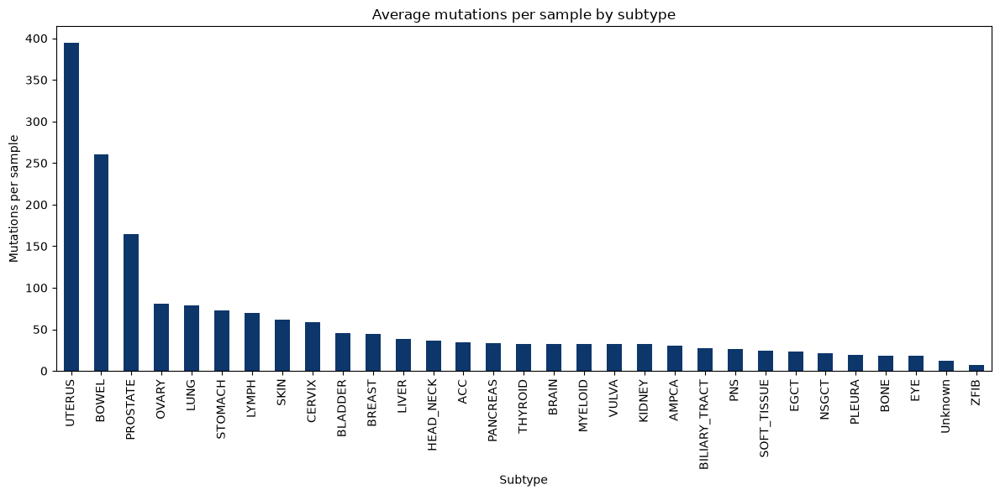

,total_mutations,average_per_sample,sample_count
subtype,,,
BOWEL,23721.0,260.670330,91
LUNG,18654.0,79.042373,236
UTERUS,16973.0,394.720930,43
LYMPH,16008.0,69.600000,230
SKIN,8657.0,61.397163,141
STOMACH,6645.0,73.021978,91
OVARY,5802.0,80.583333,72
BRAIN,3763.0,32.721739,115
HEAD_NECK,3344.0,35.956989,93


In [92]:
# Summarize damaging mutations by representative subtype.
mutation_summary = pd.DataFrame({
    'subtype': sample_subtype.reindex(mutation_burden.index),
    'mutation_burden': mutation_burden,
}).dropna()

mutation_by_subtype = (
    mutation_summary.groupby('subtype')['mutation_burden']
    .agg(total_mutations='sum', average_per_sample='mean', sample_count='size')
    .sort_values('total_mutations', ascending=False)
)

fig, ax = plt.subplots(1, 1, figsize=(12, 6))

mutation_by_subtype['average_per_sample'].sort_values(ascending=False).plot.bar(
    ax=ax, color='#0d366b'
)
ax.set_title('Average mutations per sample by subtype')
ax.set_xlabel('Subtype')
ax.set_ylabel('Mutations per sample')
ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

mutation_by_subtype

## Copy numbers

In [2]:
cn_data = pd.read_csv("Copy_Number_WGS_Public_26Q1_(log2)_subsetted.csv", index_col=0)

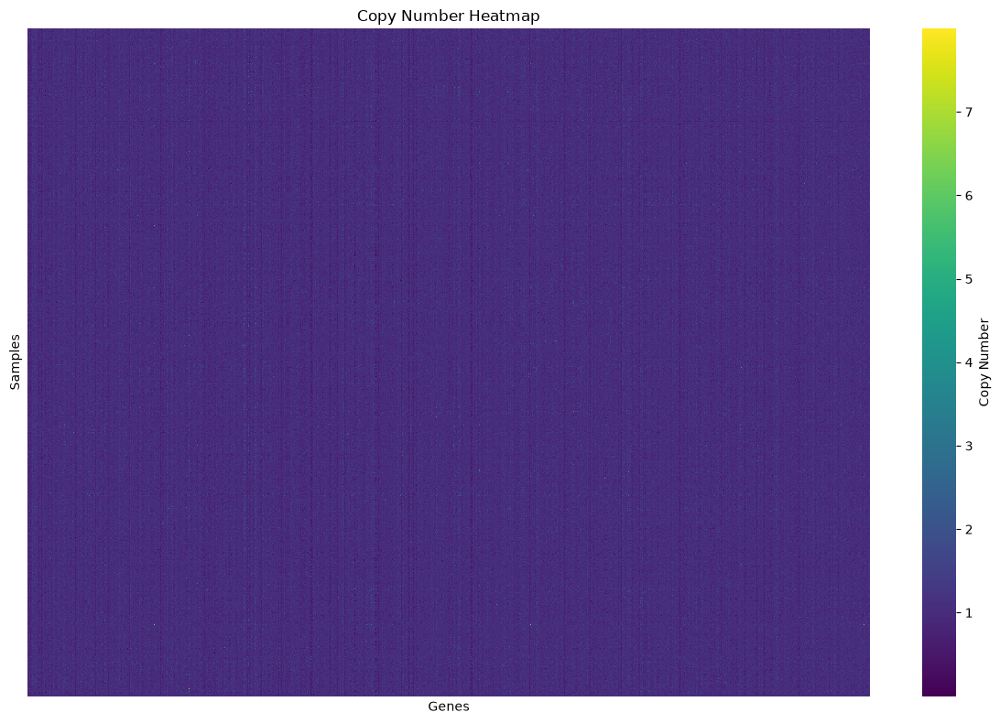

In [3]:
plt.figure(figsize=(12, 8))
sns.heatmap(cn_data, cmap='viridis', cbar_kws={'label': 'Copy Number'}, xticklabels=False, yticklabels=False)
plt.title('Copy Number Heatmap')
plt.xlabel('Genes')
plt.ylabel('Samples')
plt.tight_layout()
plt.show()

In [4]:
from scipy.cluster.hierarchy import leaves_list

N_TOP_GENES = 5000

gene_variance = cn_data.var(axis=0)
top_genes = gene_variance.sort_values(ascending=False).head(N_TOP_GENES).index

cn_top = cn_data[top_genes]
cn_z = (cn_top - cn_top.mean(axis=0)) / cn_top.std(axis=0)

row_linkage_top = fastcluster.linkage_vector(cn_z.values, method='ward', metric='euclidean')
col_linkage_top = fastcluster.linkage_vector(cn_z.values.T, method='ward', metric='euclidean')

cn_z_reordered = cn_z.iloc[leaves_list(row_linkage_top), leaves_list(col_linkage_top)]

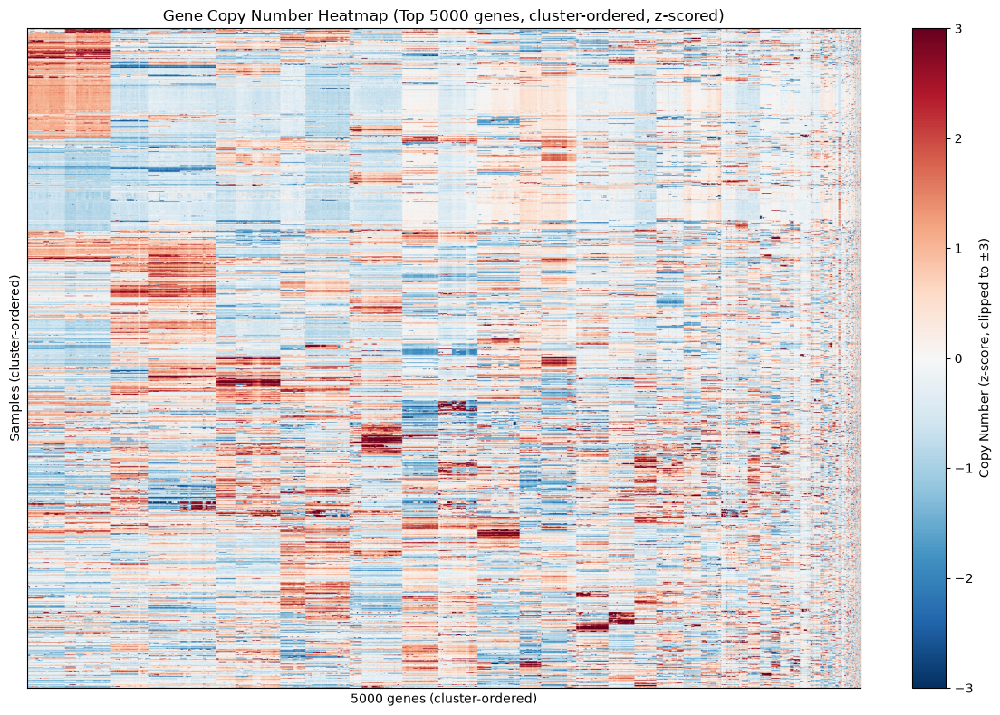

In [6]:

fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(cn_z_reordered.values, aspect='auto', cmap='RdBu_r', vmin=-3, vmax=3)
fig.colorbar(im, ax=ax, label='Copy Number (z-score, clipped to ±3)')
ax.set_title(f'Gene Copy Number Heatmap (Top {N_TOP_GENES} genes, cluster-ordered, z-scored)')
ax.set_xlabel(f'{cn_z_reordered.shape[1]} genes (cluster-ordered)')
ax.set_ylabel('Samples (cluster-ordered)')
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()